<a href="https://colab.research.google.com/github/SantiagoCalderon1999/ML-Workshop/blob/main/Workshop.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from scipy.io import arff

In [ ]:
!pip install ann_visualizer

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from keras.utils.vis_utils import plot_model

In [ ]:
from ann_visualizer.visualize import ann_viz  
from graphviz import Source

https://github.com/milaan9/Clustering-Datasets.git

In [ ]:
!git clone https://github.com/milaan9/Clustering-Datasets.git

fatal: destination path 'Clustering-Datasets' already exists and is not an empty directory.


In [ ]:
data_file = arff.loadarff("Clustering-Datasets/02. Synthetic/engytime.arff")
data = pd.DataFrame(data_file[0])
data = data.rename(columns={'class':'output'}) 
data.loc[data.output!=b'1', 'output'] = 0.0
data.loc[data.output==b'1', 'output'] = 1.0
data.head()

,x,y,output
0,1.388261,2.076096,1.0
1,2.177247,3.102304,1.0
2,0.378645,5.307610,1.0
3,3.681732,1.622681,1.0
4,2.462861,2.777897,1.0


In [ ]:
data.tail()

,x,y,output
4091,0.909687,0.375763,0.0
4092,2.698381,0.511262,0.0
4093,1.078797,1.526153,0.0
4094,1.974889,-0.649343,0.0
4095,-0.127192,-0.763974,0.0


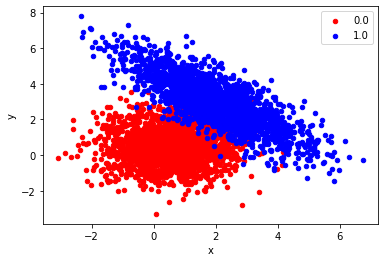

In [ ]:
grouped = data.groupby('output')
colors = {0:'red', 1:'blue'}
fig, ax = plt.subplots()
for key, group in grouped:
    group.plot(ax=ax, kind='scatter', x='x', y='y', label=key, color=colors[key])
plt.show()

In [ ]:
input = data[['x','y']]
input.head()

,x,y
0,1.388261,2.076096
1,2.177247,3.102304
2,0.378645,5.307610
3,3.681732,1.622681
4,2.462861,2.777897


In [ ]:
output = data[['output']]
output.head()

,output
0,1.0
1,1.0
2,1.0
3,1.0
4,1.0


In [ ]:
capa = tf.keras.layers.Dense(units = 1, activation = 'sigmoid', input_shape = [2])
model = tf.keras.Sequential([capa])
model.compile(
    optimizer = tf.keras.optimizers.Adam(0.1),
    loss = "mean_squared_error" 
)

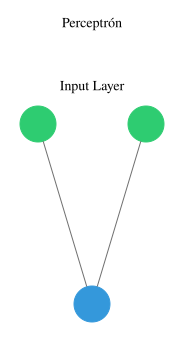

In [ ]:
ann_viz(model, title = "Perceptrón")
graph = Source.from_file("network.gv")
graph

In [ ]:
input = input.astype('float32')
output = output.astype('float32')
training = model.fit(input, output, epochs = 300)

Epoch 1/300
128/128 [==============================] - 1s 2ms/step - loss: 0.0610
Epoch 2/300
128/128 [==============================] - 0s 2ms/step - loss: 0.0343
Epoch 3/300
128/128 [==============================] - 0s 2ms/step - loss: 0.0316
Epoch 4/300
128/128 [==============================] - 0s 2ms/step - loss: 0.0304
Epoch 5/300
128/128 [==============================] - 0s 2ms/step - loss: 0.0297
Epoch 6/300
128/128 [==============================] - 0s 2ms/step - loss: 0.0294
Epoch 7/300
128/128 [==============================] - 0s 2ms/step - loss: 0.0298
Epoch 8/300
128/128 [==============================] - 0s 2ms/step - loss: 0.0290
Epoch 9/300
128/128 [==============================] - 0s 2ms/step - loss: 0.0288
Epoch 10/300
128/128 [==============================] - 0s 2ms/step - loss: 0.0300
Epoch 11/300
128/128 [==============================] - 0s 2ms/step - loss: 0.0295
Epoch 12/300
128/128 [==============================] - 0s 2ms/step - loss: 0.0289
Epoch 13/300


Text(0.5, 0, 'Error cuadrático medio')

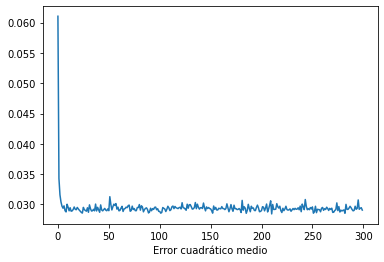

In [ ]:
plt.plot(training.history["loss"])
plt.xlabel("Época")
plt.xlabel("Error cuadrático medio")

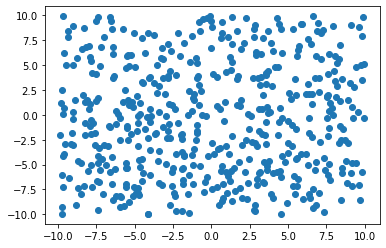

In [ ]:
input_predict = np.random.uniform(low=-10, high=10, size=(500,2))
plt.scatter(input_predict[:,0], input_predict[:,1])
plt.show()

In [ ]:
output_predict = model.predict(input_predict)

data_predict = pd.DataFrame(np.append(input_predict, output_predict, axis = 1), columns=['x', 'y', 'output'])
data_predict.head()

,x,y,output
0,3.682369,8.416748,1.000000e+00
1,0.722226,8.201358,1.000000e+00
2,0.394940,0.886358,2.817895e-04
3,-4.469863,3.248804,3.810545e-08
4,-7.941886,6.912832,3.471255e-07


In [ ]:
data_predict.loc[data_predict.output > 0.5, 'output'] = 1
data_predict.loc[data_predict.output <= 0.5, 'output'] = 0
data_predict.head()

,x,y,output
0,3.682369,8.416748,1.0
1,0.722226,8.201358,1.0
2,0.394940,0.886358,0.0
3,-4.469863,3.248804,0.0
4,-7.941886,6.912832,0.0


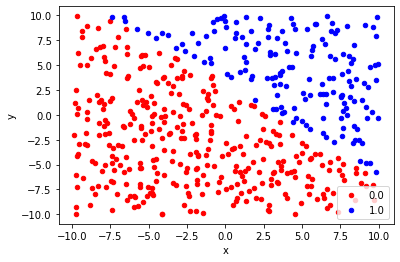

In [ ]:
grouped = data_predict.groupby('output')
colors = {0:'red', 1:'blue'}
fig, ax = plt.subplots()
for key, group in grouped:
    group.plot(ax=ax, kind='scatter', x='x', y='y', label=key, color=colors[key])
plt.show()

In [ ]:
import cv2
from google.colab.patches import cv2_imshow
import urllib.request

In [ ]:
faceCascade = cv2.CascadeClassifier(cv2.samples.findFile(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml'))

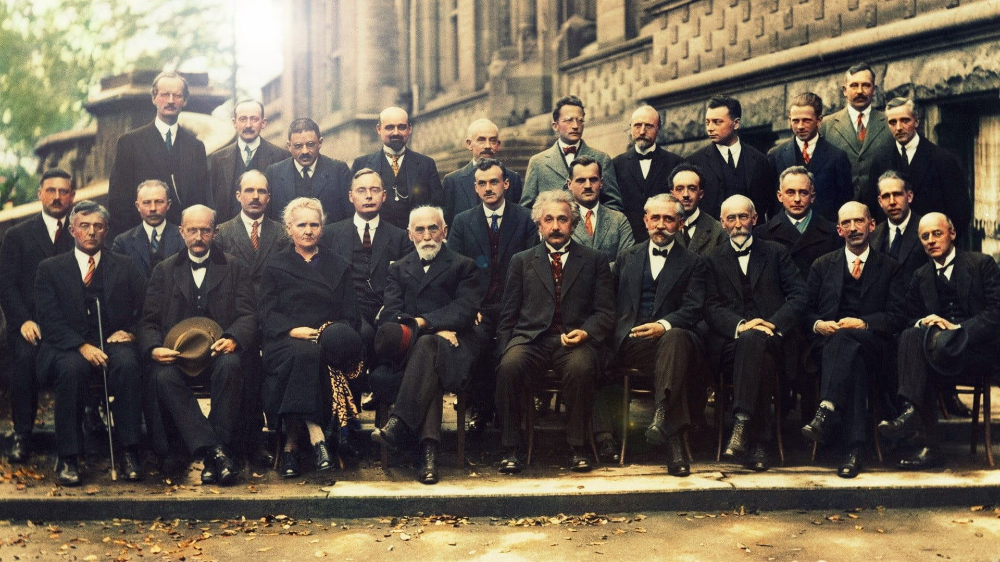

In [ ]:
url = "https://i.pinimg.com/originals/fe/3c/b4/fe3cb4bb4fa5116b484fa9b17cb62f24.jpg"

url_response = urllib.request.urlopen(url)
img = cv2.imdecode(np.array(bytearray(url_response.read()), dtype=np.uint8), -1)
cv2_imshow(img)

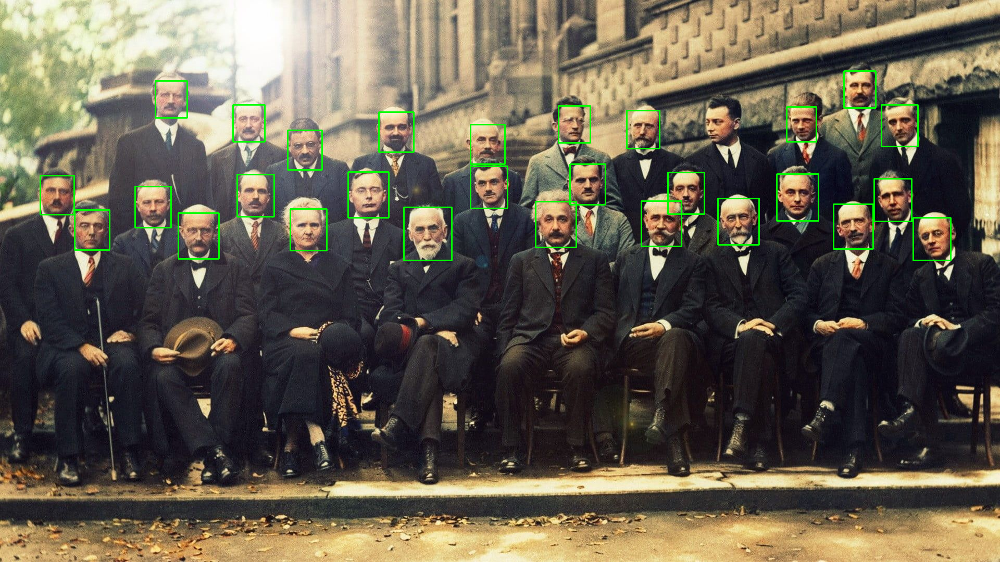

In [ ]:
url_response = urllib.request.urlopen(url)
img = cv2.imdecode(np.array(bytearray(url_response.read()), dtype=np.uint8), -1)


gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

faces = faceCascade.detectMultiScale(
    gray,
    scaleFactor=1.1,
    minNeighbors=12,
    minSize=(30, 30),
    flags = cv2.CASCADE_SCALE_IMAGE
)

color = (0, 255, 0)
img_2 = img.copy()

for (x, y, w, h) in faces:
    img_2 = cv2.rectangle(img_2, (x, y-5), (x+w, y+h+5), color, 2)
    
cv2_imshow(img_2)

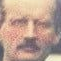

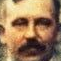

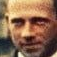

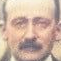

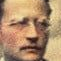

...

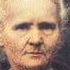

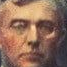

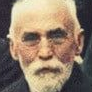

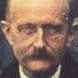

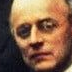

In [ ]:
sub_img = []
for (x, y, w, h) in faces:
    sub_img.append(img[y:y+h, x:x+w])
    cv2_imshow(sub_img[-1])

In [ ]:
!pip install deepface
from deepface import DeepFace

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
face_analysis = []
for i in range(len(sub_img)):
  try:
    face_analysis.append(DeepFace.analyze(sub_img[i])['dominant_emotion'])
  except:
    print("Couldn't identify this face")
    face_analysis.append('no emotion')

Action: emotion:   0%|          | 0/4 [00:00<?, ?it/s]


Couldn't identify this face


Action: emotion:   0%|          | 0/4 [00:00<?, ?it/s]


Couldn't identify this face


Action: emotion:   0%|          | 0/4 [00:00<?, ?it/s]


Couldn't identify this face


Action: race: 100%|██████████| 4/4 [00:00<00:00,  4.79it/s]


In [ ]:
print(face_analysis)

['no emotion', 'neutral', 'happy', 'neutral', 'fear', 'sad', 'happy', 'angry', 'no emotion', 'no emotion', 'sad', 'neutral', 'angry', 'sad', 'neutral', 'neutral', 'fear', 'angry', 'sad', 'neutral', 'neutral', 'angry', 'angry', 'neutral', 'neutral', 'neutral', 'neutral', 'angry']


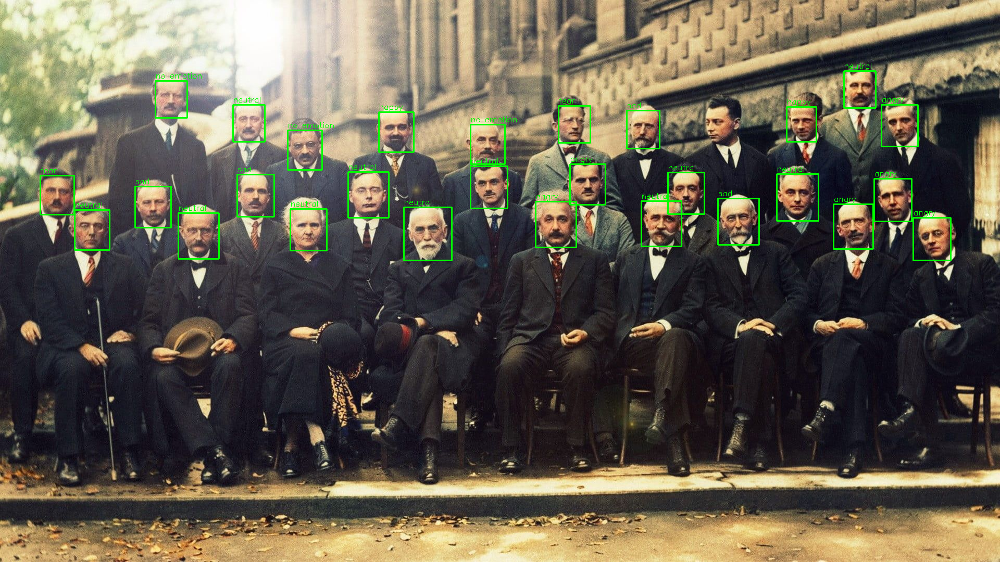

In [ ]:
idx = 0
font                   = cv2.FONT_HERSHEY_SIMPLEX
bottomLeftCornerOfText = (10,10)
fontScale              = 0.5
fontColor              = (0,255,0)
thickness              = 1
lineType               = 2
img_3 = img_2.copy()
for (x, y, w, h) in faces:
  img_3 = cv2.putText(img_3, face_analysis[idx], [x,y-10], 
    font, 
    fontScale,
    fontColor,
    thickness,
    lineType)
  idx=idx+1
cv2_imshow(img_3)